# HLS Burn Scars

## Task: Adapt the notebook yourself to perform fine-tuning with TerraMind on HLS Burn Scars.

You find several TODOs in this notebook.

Use the dataset description (https://huggingface.co/datasets/ibm-nasa-geospatial/hls_burn_scars) and the TerraMind docs (https://terrastackai.github.io/terratorch/stable/guide/terramind/) to solve the TODOs.

# Setup

In colab:
1. Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
2. Install TerraTorch

In [1]:
!pip install terratorch==1.1.1
!pip install gdown tensorboard

In [2]:
import os
import torch
import gdown
import terratorch
import albumentations
import numpy as np
import lightning.pytorch as pl
import matplotlib.pyplot as plt
from pathlib import Path
from terratorch.datamodules import GenericNonGeoSegmentationDataModule
import warnings
warnings.filterwarnings("ignore")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


3. Download the dataset from Google Drive

In [ ]:
# This version is an adaptation from https://huggingface.co/datasets/ibm-nasa-geospatial/hls_burn_scars (same data, updated folder structure) with splits from https://github.com/IBM/peft-geofm/tree/main/datasets_splits/burn_scars. You can also download the original data from Hugging Face.

if not os.path.isfile('hls_burn_scars.tar.gz'):
    gdown.download("https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC")

if not os.path.isdir('hls_burn_scars/'):
    !tar -xzf hls_burn_scars.tar.gz

Downloading...
From (original): https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC
From (redirected): https://drive.google.com/uc?id=1yFDNlGqGPxkc9lh9l1O70TuejXAQYYtC&confirm=t&uuid=14382230-45bd-42cb-8336-8e991600a7f5
To: /content/hls_burn_scars.tar.gz
 94%|█████████▍| 2.50G/2.65G [00:49<00:02, 59.1MB/s]

## HLS Burn Scars Dataset

Lets start with analysing the dataset

In [4]:
dataset_path = Path("hls_burn_scars")
!ls "hls_burn_scars"

data  splits


In [5]:
!ls "hls_burn_scars/splits/" | head

test.txt
train.txt
val.txt


In [6]:
!ls "hls_burn_scars/data/" | head

subsetted_512x512_HLS.S30.T10SDH.2020248.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SDH.2020248.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018190.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018190.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018245.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018245.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2018280.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2018280.v1.4_merged.tif
subsetted_512x512_HLS.S30.T10SEH.2019305.v1.4.mask.tif
subsetted_512x512_HLS.S30.T10SEH.2019305.v1.4_merged.tif


In [7]:
!head "hls_burn_scars/splits/train.txt"

T10SEJ.2018185.v1
T10SFE.2020267.v1
T10SFE.2021166.v1
T10SFF.2018155.v1
T10SFF.2018190.v1
T10SFF.2020215.v1
T10SFF.2020250.v1
T10SFF.2021189.v1
T10SFG.2020215.v1
T10SFH.2018185.v1


In [8]:
import rioxarray as rxr
sample = rxr.open_rasterio('hls_burn_scars/data/subsetted_512x512_HLS.S30.T10SDH.2020248.v1.4_merged.tif')
sample

<xarray.DataArray (band: 6, y: 512, x: 512)> Size: 6MB
[1572864 values with dtype=float32]
Coordinates:
  * band         (band) int64 48B 1 2 3 4 5 6
  * y            (y) float64 4kB 4.282e+06 4.282e+06 ... 4.267e+06 4.267e+06
  * x            (x) float64 4kB 4.912e+05 4.913e+05 ... 5.065e+05 5.066e+05
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     0.0
    scale_factor:   1.0
    add_offset:     0.0

TerraTorch provides generic data modules that work directly with PyTorch Lightning. For single-modal datasets we recommend the `GenericNonGeoSegmentationDataModule`.
Check the docs for the parameters.

Data module: https://terrastackai.github.io/terratorch/stable/package/generic_datamodules/#terratorch.datamodules.generic_pixel_wise_data_module.GenericNonGeoSegmentationDataModule

Dataset: https://terrastackai.github.io/terratorch/stable/package/generic_datasets/#terratorch.datasets.generic_pixel_wise_dataset.GenericNonGeoSegmentationDataset

In [20]:
datamodule = terratorch.datamodules.GenericNonGeoSegmentationDataModule(
    batch_size=8,
    num_workers=2,
    num_classes=2,

    # RGB visualization order (Sentinel-2 için)
    rgb_indices=[2, 1, 0],

    # === DATA ROOTS ===
    train_data_root="hls_burn_scars/data",
    train_label_data_root="hls_burn_scars/data",

    val_data_root="hls_burn_scars/data",
    val_label_data_root="hls_burn_scars/data",

    test_data_root="hls_burn_scars/data",
    test_label_data_root="hls_burn_scars/data",

    # === SPLITS ===
    train_split="hls_burn_scars/splits/train.txt",
    val_split="hls_burn_scars/splits/val.txt",
    test_split="hls_burn_scars/splits/test.txt",

    # === FILE MATCHING ===
    img_grep="*_merged.tif",
    label_grep="*.mask.tif",

    # === NORMALIZATION (S2L2A) ===
    constant_scale=1.0,
    means=[
        0.033349706741586264,
        0.05701185520536176,
        0.05889748132001316,
        0.2323245113436119,
        0.1972854853760658,
        0.11944914225186566,
    ],
    stds=[
        0.02269135568823774,
        0.026807560223070237,
        0.04004109844362779,
        0.07791732423672691,
        0.08708738838140137,
        0.07241979477437814,
    ],

    # === AUGMENTATION ===
    train_transform=[
        albumentations.D4(),
        albumentations.pytorch.transforms.ToTensorV2(),
    ],
    val_transform=[albumentations.pytorch.transforms.ToTensorV2()],
    test_transform=[albumentations.pytorch.transforms.ToTensorV2()],

    no_label_replace=-1,
    no_data_replace=0,
)

datamodule.setup("fit")


In [21]:
# checking datasets validation split size
val_dataset = datamodule.val_dataset
len(val_dataset)

160

In [22]:
# Helper function for plotting both modalities
def plot_sample(sample):
    data = sample['image'].cpu().numpy()
    mask = sample['mask'].cpu().numpy()

    # Scaling data.
    if data.mean() < 1:
        data = data * 10000
    data = (data.clip(0, 2000) / 2000) * 255
    rgb = data[[2, 1, 0]].astype(np.uint8).transpose(1,2,0)

    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(rgb)
    ax[0].set_title('Image')
    ax[0].axis('off')
    ax[1].imshow(mask, vmin=-1, vmax=1, interpolation='nearest')
    ax[1].set_title('Mask')
    ax[1].axis('off')
    ax[2].imshow(rgb)
    ax[2].imshow(mask, vmin=-1, vmax=1, interpolation='nearest', alpha=0.5)
    ax[2].set_title('Mask on Image')
    ax[2].axis('off')
    fig.tight_layout()
    plt.show()

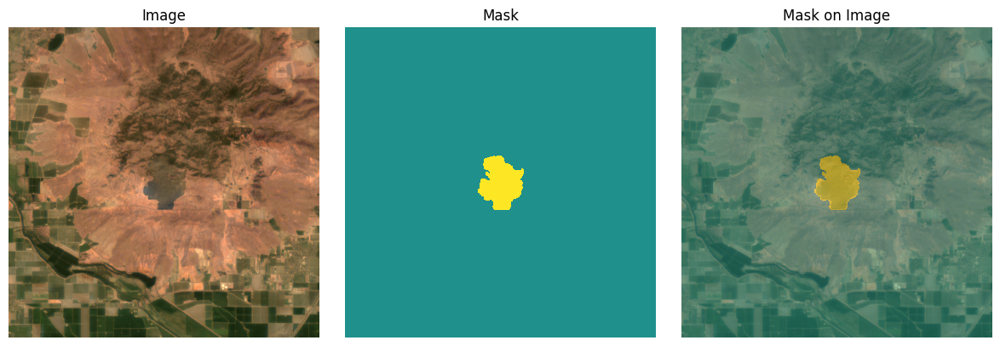

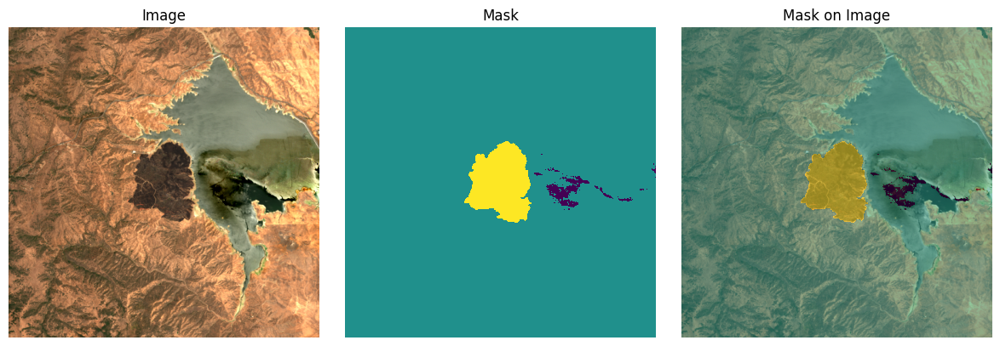

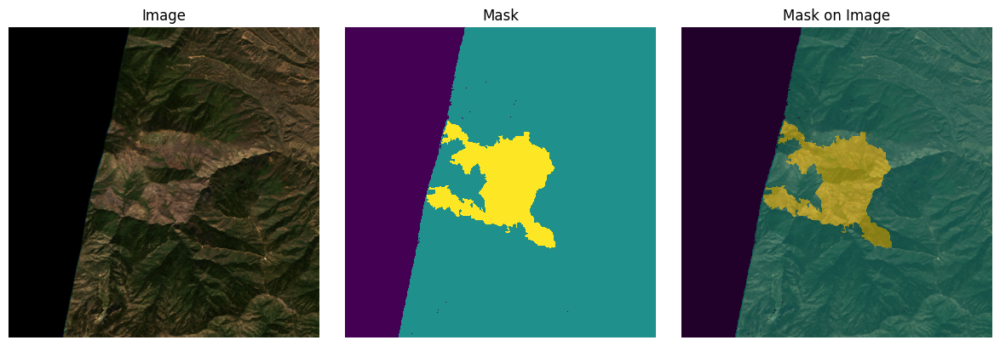

In [23]:
# Plotting a few samples
plot_sample(val_dataset[0])
plot_sample(val_dataset[1])
plot_sample(val_dataset[2])

# The GenericMultiModalDataModule has an integrated plotting function.
# We use a custom one because the 0-2000 scaling looks a bit nicer than the min-max scaling of the integrated function.

# val_dataset.plot(val_dataset[0])
# plt.show()

In [25]:
# checking datasets testing split size
datamodule.setup("test")
test_dataset = datamodule.test_dataset
len(test_dataset)

120

# Fine-tune TerraMind via PyTorch Lightning

With TerraTorch, we can use standard Lightning components for the fine-tuning.
These include callbacks and the trainer class.
TerraTorch provides EO-specific tasks that define the training and validation steps.
In this case, we are using the `SemanticSegmentationTask`.
We refer to the [TerraTorch paper](https://arxiv.org/abs/2503.20563) for a detailed explanation of the TerraTorch tasks.

In [26]:
import lightning.pytorch as pl
import terratorch

pl.seed_everything(0)

# =========================
# Checkpoint
# =========================
checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath="output/terramind_small_burnscars/checkpoints",
    mode="max",
    monitor="val/mIoU",
    filename="best-mIoU",
    save_weights_only=True,
)

# =========================
# Trainer
# =========================
trainer = pl.Trainer(
    accelerator="auto",
    strategy="auto",
    devices=1,                  # Notebooklarda stabil
    precision="16-mixed",
    num_nodes=1,
    logger=True,                # TensorBoard
    max_epochs=3,               # Demo amaçlı
    log_every_n_steps=1,
    callbacks=[checkpoint_callback, pl.callbacks.RichProgressBar()],
    default_root_dir="output/terramind_small_burnscars",
)

# =========================
# Model
# =========================
model = terratorch.tasks.SemanticSegmentationTask(
    model_factory="EncoderDecoderFactory",
    model_args={
        # -------- Backbone --------
        "backbone": "terramind_v1_small",
        "backbone_pretrained": True,

        # ✅ ORİJİNAL MODALITY
        "backbone_modalities": ["S2L2A"],

        # ✅ ORİJİNAL BAND SEÇİMİ (Burn Scars)
        "backbone_bands": {
            "S2L2A": [
                "BLUE",
                "GREEN",
                "RED",
                "NIR_NARROW",
                "SWIR_1",
                "SWIR_2",
            ]
        },

        # -------- Necks --------
        "necks": [
            {
                "name": "SelectIndices",
                "indices": [2, 5, 8, 11],   # terramind_v1_small / base
            },
            {
                "name": "ReshapeTokensToImage",
                "remove_cls_token": False,  # TerraMind CLS token kullanmaz
            },
            {
                "name": "LearnedInterpolateToPyramidal",
            },
        ],

        # -------- Decoder --------
        "decoder": "UNetDecoder",
        "decoder_channels": [256, 128, 64, 32],

        # -------- Head --------
        "head_dropout": 0.1,
        "num_classes": 2,
    },

    # =========================
    # Training setup
    # =========================
    loss="dice",                 # Binary segmentation için önerilir
    optimizer="AdamW",
    lr=2e-5,
    ignore_index=-1,

    freeze_backbone=True,        # Demo hızlandırma
    freeze_decoder=False,

    plot_on_val=True,
    class_names=["Others", "Burned"],
)


INFO: Seed set to 0
INFO:lightning.fabric.utilities.seed:Seed set to 0
INFO: Using bfloat16 Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using bfloat16 Automatic Mixed Precision (AMP)
INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [27]:
# Before starting the fine-tuning, you can start the tensorboard with:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4008), started 0:01:40 ago. (Use '!kill 4008' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Training
trainer.fit(model, datamodule=datamodule)

┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │ 25.8 M │ train │
│ 1 │ criterion     │ DiceLoss         │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 3.9 M                                                                                            
Non-trainable params: 21.9 M                                                                                       
Total params: 25.8 M                                                                                               
Total estimated model params size (MB): 103                                                                        
Modules in train mode: 288                                                                                         
Modules in eval mode: 0

Output()

After fine-tuning, we can evaluate the model on the test set:

In [ ]:
# Let's test the fine-tuned model
best_ckpt_path = "output/terramind_small_burnscars/checkpoints/best-mIoU.ckpt"
trainer.test(model, datamodule=datamodule, ckpt_path=best_ckpt_path)

# Note: This demo only trains for 3 epochs by default, which does not result in good test metrics.

In [ ]:
# Now we can use the model for predictions and plotting
model = terratorch.tasks.SemanticSegmentationTask.load_from_checkpoint(
    best_ckpt_path,
    model_factory=model.hparams.model_factory,
    model_args=model.hparams.model_args,
)

test_loader = datamodule.test_dataloader()
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"]
    for mod, value in images.items():
        images[mod] = value.to(model.device)
    masks = batch["mask"].numpy()

    with torch.no_grad():
        outputs = model(images)

    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(5):
    sample = {
        "image": batch["image"]["S2L2A"][i].cpu(),
        "mask": batch["mask"][i],
        "prediction": preds[i],
    }
    plot_sample(sample)
    # test_dataset.plot(sample)
    # plt.show()

# Note: This demo only trains for 5 epochs by default, which does not result in good predictions.

# Burnscars config

If you are struggling with this task, you can check this burn scars config for guidance.

Please note, that this config uses the generic segmentation dataset instead of the generic multimodal dataset. The idea is similar, but the details are a bit different (e.g. dicts of strings).

In [ ]:
# Download config
!wget https://raw.githubusercontent.com/IBM/terramind/refs/heads/main/configs/terramind_v1_base_burnscars.yaml

In [ ]:
# Check the config
!cat terramind_v1_base_burnscars.yaml